<a href="https://colab.research.google.com/github/Thrna06/Flower-image-generators/blob/main/Flower_image_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
!nvidia-smi


Tue Sep 22 15:17:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P0             27W /   70W |    1057MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [28]:
!pip install -q torch torchvision torchmetrics[image] torch-fidelity matplotlib


In [29]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image

from torchmetrics.image.fid import FrechetInceptionDistance


In [30]:
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)


PyTorch version: 2.11.0+cu128
CUDA available: True
Using: cuda


In [31]:
!wget -q https://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz


In [32]:
!tar -xzf 102flowers.tgz


In [33]:
!ls jpg | head


image_00001.jpg
image_00002.jpg
image_00003.jpg
image_00004.jpg
image_00005.jpg
image_00006.jpg
image_00007.jpg
image_00008.jpg
image_00009.jpg
image_00010.jpg


In [34]:
from torch.utils.data import Dataset

class FlowersDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        self.images = [
            os.path.join(image_dir, img)
            for img in os.listdir(image_dir)
            if img.endswith(".jpg")
        ]

        self.images.sort()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image


In [35]:
IMAGE_SIZE = 64

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=(0.5, 0.5, 0.5),
        std=(0.5, 0.5, 0.5)
    )
])


In [36]:
[0, 1]


[0, 1]

In [37]:
dataset = FlowersDataset(
    image_dir="jpg",
    transform=transform
)

BATCH_SIZE = 128

dataloader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print("Number of images:", len(dataset))
print("Number of batches:", len(dataloader))


Number of images: 8189
Number of batches: 64


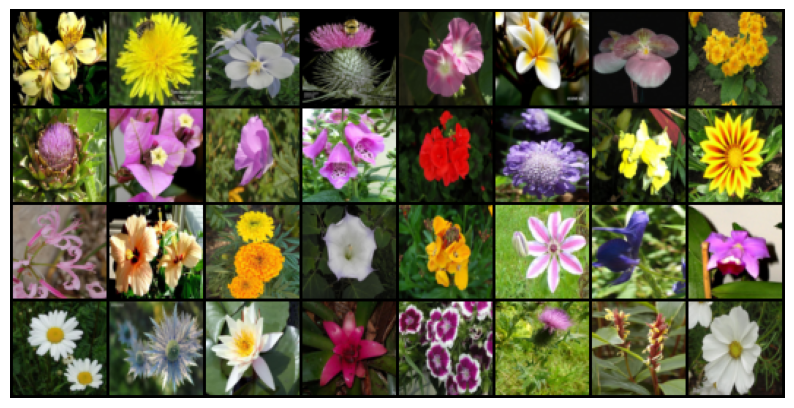

In [38]:
images = next(iter(dataloader))

grid = make_grid(
    images[:32],
    nrow=8,
    normalize=True
)

plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.show()


In [39]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()

        self.model = nn.Sequential(

            # 100 -> 512 x 4 x 4
            nn.ConvTranspose2d(
                latent_dim, 512,
                kernel_size=4,
                stride=1,
                padding=0,
                bias=False
            ),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # 4 -> 8
            nn.ConvTranspose2d(
                512, 256,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # 8 -> 16
            nn.ConvTranspose2d(
                256, 128,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # 16 -> 32
            nn.ConvTranspose2d(
                128, 64,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # 32 -> 64
            nn.ConvTranspose2d(
                64, 3,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),

            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)


In [40]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(

            # 64 -> 32
            nn.Conv2d(
                3, 64,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.LeakyReLU(0.2, inplace=True),

            # 32 -> 16
            nn.Conv2d(
                64, 128,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # 16 -> 8
            nn.Conv2d(
                128, 256,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # 8 -> 4
            nn.Conv2d(
                256, 512,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # 4 -> 1
            nn.Conv2d(
                512, 1,
                kernel_size=4,
                stride=1,
                padding=0,
                bias=False
            ),

            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x).view(-1)


In [41]:
LATENT_DIM = 100

G = Generator(LATENT_DIM).to(device)
D = Discriminator().to(device)

print(G)
print(D)


Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [42]:
def weights_init(m):
    classname = m.__class__.__name__

    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [43]:
G.apply(weights_init)
D.apply(weights_init)


Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [44]:
criterion = nn.BCELoss()


In [45]:
LR = 0.0002
BETA1 = 0.5

optimizer_G = optim.Adam(
    G.parameters(),
    lr=LR,
    betas=(BETA1, 0.999)
)

optimizer_D = optim.Adam(
    D.parameters(),
    lr=LR,
    betas=(BETA1, 0.999)
)


In [46]:
FIXED_NOISE = torch.randn(
    64,
    LATENT_DIM,
    1,
    1,
    device=device
)


In [47]:
NUM_EPOCHS = 30

G_losses = []
D_losses = []

for epoch in range(NUM_EPOCHS):

    for real_images in dataloader:

        real_images = real_images.to(device)

        batch_size = real_images.size(0)

        # --------------------------------
        # Train Discriminator
        # --------------------------------

        D.zero_grad()

        real_labels = torch.ones(
            batch_size,
            device=device
        )

        fake_labels = torch.zeros(
            batch_size,
            device=device
        )

        # Real images
        real_output = D(real_images)

        loss_real = criterion(
            real_output,
            real_labels
        )

        # Generate fake images
        noise = torch.randn(
            batch_size,
            LATENT_DIM,
            1,
            1,
            device=device
        )

        fake_images = G(noise)

        fake_output = D(
            fake_images.detach()
        )

        loss_fake = criterion(
            fake_output,
            fake_labels
        )

        # Total discriminator loss
        loss_D = loss_real + loss_fake

        loss_D.backward()
        optimizer_D.step()

        # --------------------------------
        # Train Generator
        # --------------------------------

        G.zero_grad()

        fake_output = D(fake_images)

        loss_G = criterion(
            fake_output,
            real_labels
        )

        loss_G.backward()
        optimizer_G.step()

        # Save losses
        G_losses.append(loss_G.item())
        D_losses.append(loss_D.item())

    print(
        f"Epoch [{epoch+1}/{NUM_EPOCHS}] "
        f"Loss D: {loss_D.item():.4f} "
        f"Loss G: {loss_G.item():.4f}"
    )

    # Generate sample images
    with torch.no_grad():

        fake_samples = G(FIXED_NOISE)

        save_image(
            fake_samples,
            f"generated_epoch_{epoch+1}.png",
            normalize=True,
            nrow=8
        )


Epoch [1/30] Loss D: 1.1088 Loss G: 18.6559
Epoch [2/30] Loss D: 0.3411 Loss G: 7.2698
Epoch [3/30] Loss D: 0.3938 Loss G: 3.7354
Epoch [4/30] Loss D: 0.4074 Loss G: 4.3527
Epoch [5/30] Loss D: 0.8212 Loss G: 7.2112
Epoch [6/30] Loss D: 0.6759 Loss G: 2.2041
Epoch [7/30] Loss D: 0.9845 Loss G: 6.7511
Epoch [8/30] Loss D: 0.6637 Loss G: 3.9635
Epoch [9/30] Loss D: 0.6329 Loss G: 5.9093
Epoch [10/30] Loss D: 1.1894 Loss G: 3.3938
Epoch [11/30] Loss D: 0.5785 Loss G: 3.4368
Epoch [12/30] Loss D: 1.0527 Loss G: 1.1054
Epoch [13/30] Loss D: 0.7781 Loss G: 5.0262
Epoch [14/30] Loss D: 0.8190 Loss G: 2.8299
Epoch [15/30] Loss D: 0.3804 Loss G: 3.4485
Epoch [16/30] Loss D: 0.4246 Loss G: 3.2201
Epoch [17/30] Loss D: 0.5681 Loss G: 3.7032
Epoch [18/30] Loss D: 1.5832 Loss G: 6.0159
Epoch [19/30] Loss D: 0.8061 Loss G: 4.5081
Epoch [20/30] Loss D: 0.5685 Loss G: 3.3247
Epoch [21/30] Loss D: 0.5482 Loss G: 3.0595
Epoch [22/30] Loss D: 1.0236 Loss G: 1.6620
Epoch [23/30] Loss D: 0.7863 Loss G: 3.1

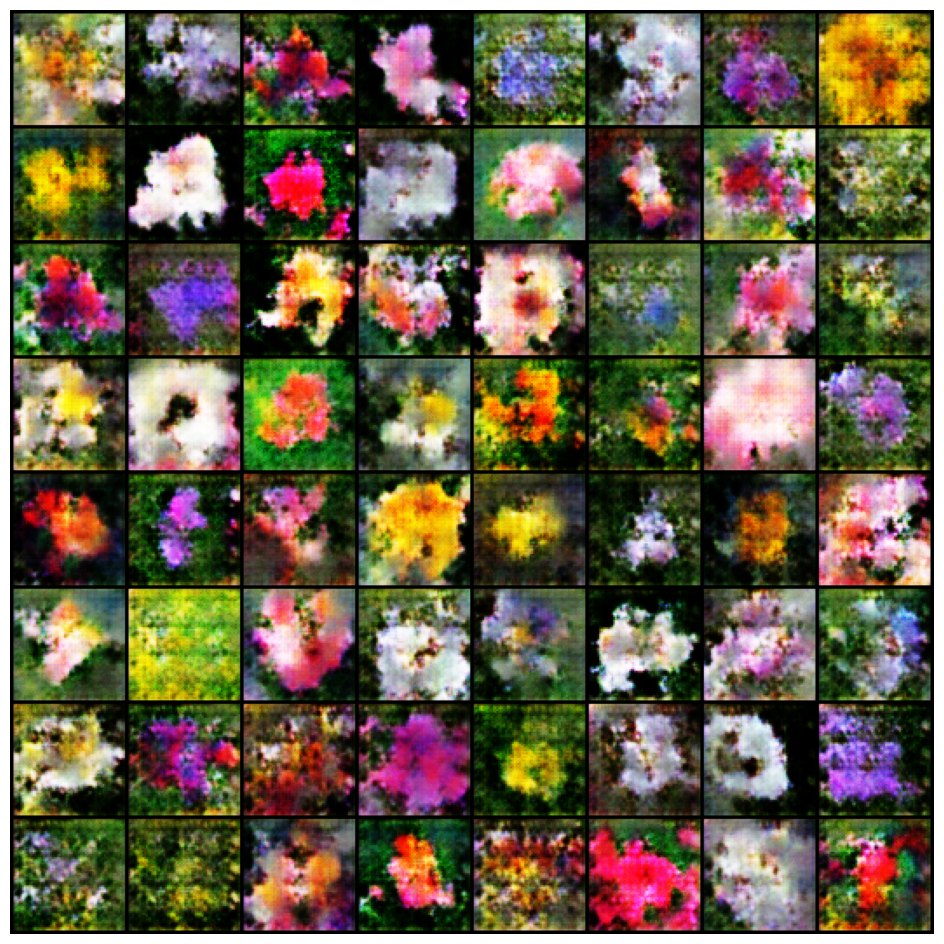

In [48]:
fake_images = G(FIXED_NOISE).detach().cpu()

grid = make_grid(
    fake_images,
    nrow=8,
    normalize=True
)

plt.figure(figsize=(12, 12))
plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.show()


Epoch 1


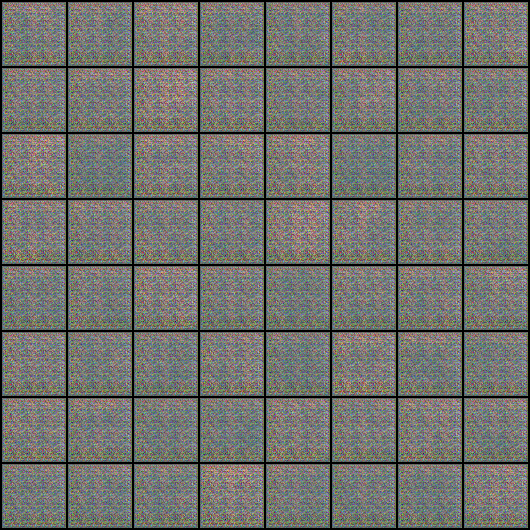

Epoch 5


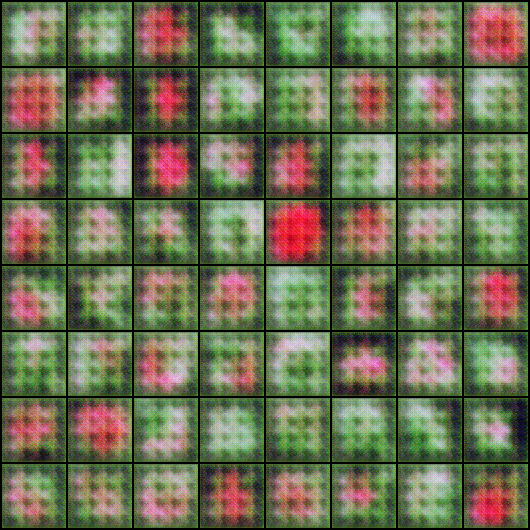

Epoch 10


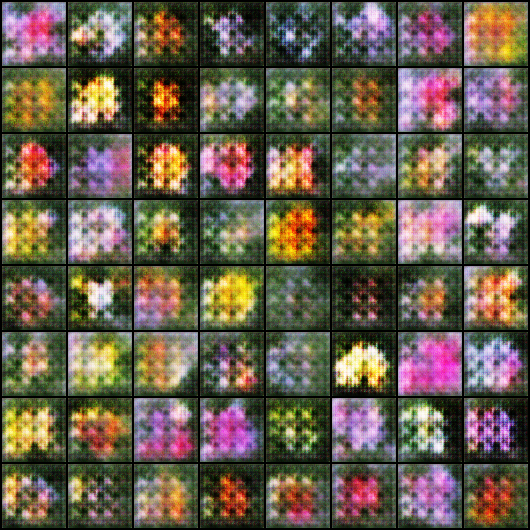

Epoch 15


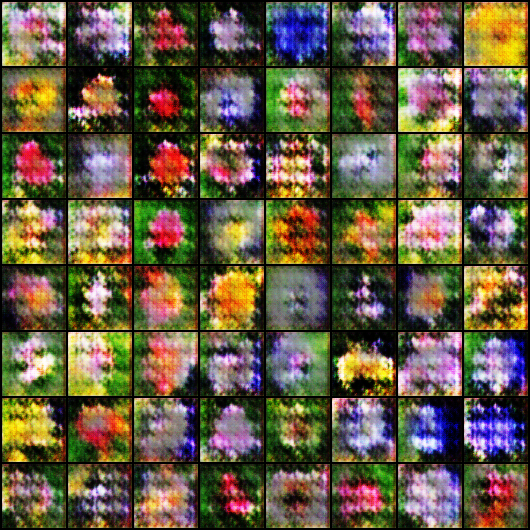

Epoch 20


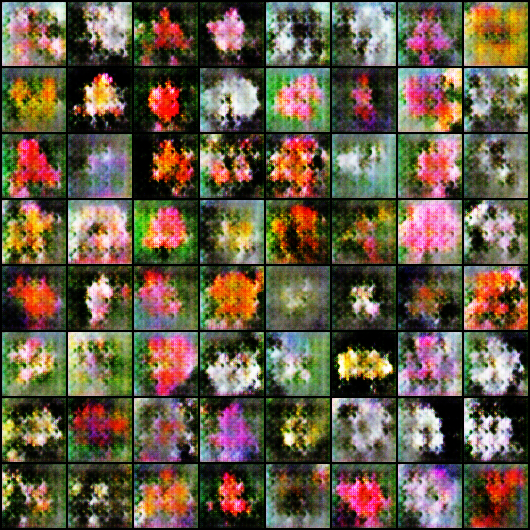

Epoch 25


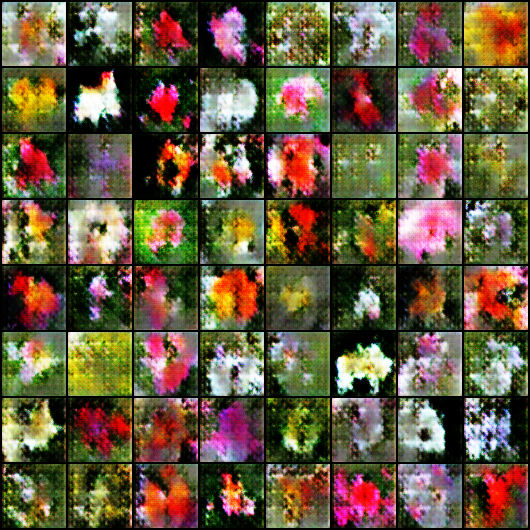

Epoch 30


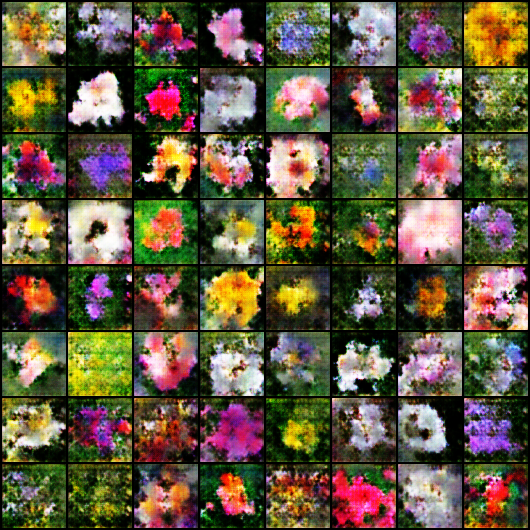

In [49]:
from IPython.display import display

for epoch in [1, 5, 10, 15, 20, 25, 30]:

    filename = f"generated_epoch_{epoch}.png"

    if os.path.exists(filename):

        print(f"Epoch {epoch}")

        img = Image.open(filename)

        display(img)


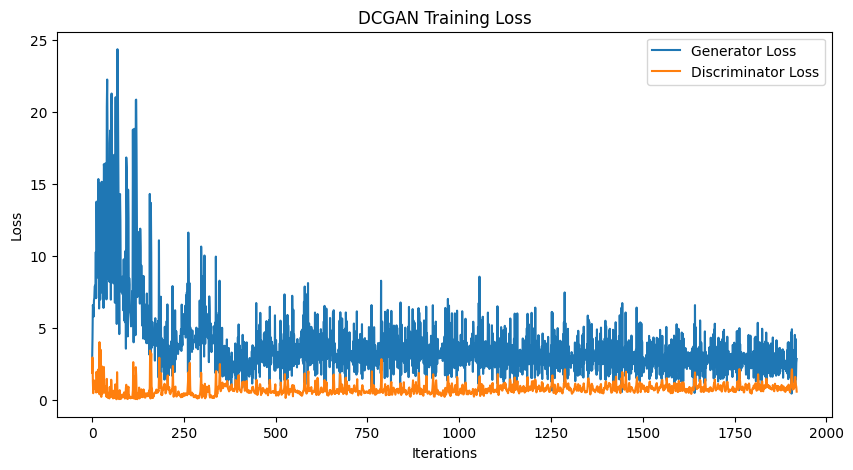

In [50]:
plt.figure(figsize=(10, 5))

plt.plot(G_losses, label="Generator Loss")
plt.plot(D_losses, label="Discriminator Loss")

plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("DCGAN Training Loss")

plt.legend()
plt.show()


In [52]:
os.makedirs("generated_flowers", exist_ok=True)


In [53]:
G.eval()

with torch.no_grad():

    for i in range(1000):

        noise = torch.randn(
            1,
            LATENT_DIM,
            1,
            1,
            device=device
        )

        fake = G(noise)

        save_image(
            fake,
            f"generated_flowers/fake_{i:05d}.png",
            normalize=True
        )

print("Generated 1000 images.")


Generated 1000 images.


In [54]:
import shutil

os.makedirs("real_flowers", exist_ok=True)

real_files = [
    os.path.join("jpg", f)
    for f in os.listdir("jpg")
    if f.endswith(".jpg")
]

random.shuffle(real_files)

NUM_FID_IMAGES = 1000

for i, file in enumerate(real_files[:NUM_FID_IMAGES]):

    shutil.copy(
        file,
        f"real_flowers/real_{i:05d}.jpg"
    )

print("Prepared real images:", NUM_FID_IMAGES)


Prepared real images: 1000
